# EU capitals district geometry

**Code created by Pietro Florio, Post-Doctoral researcher at EPFL**

https://www.linkedin.com/in/pietroflorio/?originalSubdomain=ch
https://people.epfl.ch/pietro.florio

**Purpose**

This notebook employs open source databases to create a shapefile that includes terrain, roads and buildings LOD-1 data, including an estimation of building heights.

**Sources**
* It works for European capitals, the complete list of available cities is available at this link:
https://land.copernicus.eu/local/urban-atlas/building-height-2012?tab=download
* It uses OpenStreetMap data to get the building footprint polygons https://www.openstreetmap.org
* It uses Copernicus Building Height 2012 dataset to get buildings' height, which is available only for European capitals as specified above https://land.copernicus.eu/local/urban-atlas/building-height-2012
* It uses Copernicus EU-DEM v.1.1 data to get terrain data. https://land.copernicus.eu/imagery-in-situ/eu-dem/eu-dem-v1.1

**Outputs**
* 2D shapefile of the roadnetwork
* 2D shapefile of buildingfootprints, which include a field for building heights
* ASCII and tiff file of the clipped terrain
outputs can be combined and extruded in 3D vector software tools, such as Grasshopper for Rhino https://www.grasshopper3d.com/
check also the DTM plugin for Grasshopper to correctly import the terrain:
https://www.food4rhino.com/app/dtm-digital-terrain-mesh

**Requirements**
Python 3.* with the following libraries:
* osmnx
* geopandas
* pandas
* numpy
* rasterio
* rasterstats

It is recommended to create an Anaconda environemnt with rthe requires packages using the following command:

`conda env create -f EUcities.yml`

**More specs on building heights calculation**
Building heights are issued from zonal statistics between the building footprints in the selected area and the building heights 2012 raster. Such raster, classifies the heights in 10 bins (2-4, 4-6, 6-8, 8-10, 10-15, 15-20, 20-30, 30-60, 60-100, >100 meters height). Per each building footprint, the weighted average of the number of pixels in a given bin times a random height within the bin range is calculated. This gives the calculated height.

**Use**
* Open the script with Jupyter Notebook. 
* Indicate the work directory and the sampling distance resolution for the raster DEM.
* Create a dictionary containing the cities as keys and a list of OSM regions (relations IDs) as value. 
    * To gather the relation ID of a OSM region, simply go to https://www.openstreetmap.org
    * On the right-side toolbar, select the "query on object" tool, i.e. a mousepointer with a questionmark
    * click on a point on the map
    * scroll the frame that appears on the left to the "encapsulating objects" list
    * select the boundary of interest. It will be highlighted in the map
    * the number in parentheses () after the region name is the relation ID
* Run the script.

## Needed libraries

In [1]:
import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt
import requests
import pandas as pd
import numpy as np
import rasterio
import rasterstats
import os

## Cities list

* Barcelona
* Belgrade
* Gothenburg
* Milan
* Munich
* Nicosia
* Sarajevo
* Warsaw

European capitals available from Copernicus Building Height Database 2012:
https://land.copernicus.eu/local/urban-atlas/building-height-2012?tab=download

## User input

Please fill this section carefully, indicating the relation IDs for each city

In [6]:
citieszones={
    'Amsterdam':[11298758], # no relations?, check
    'Athens':[10982159],   
    'Belgrad':[10625810],
    'Berlin':[16566],
    'Brussels':[7052712],
    'Bucharest':[7960937],
    'Copenhagen':[9571546,9571547,4232118],
    'Dublin':[4275226,4271343],
    'Ljubjiana':[11298251], # no relations?, check
    'London':[51781],
    'Madrid':[8816050,8815803],
    'Oslo':[1279948],
    'Paris':[9597],
    'Prague':[428812],
    'Rome':[5452758,5452746,5452744],
    'Sofia':[3824649],
    'Stockholm':[5695398,5695409],
    'Sarajevo':[6969254,6969255,6969251],
    'Warsaw':[11191570,11191573,11191574]
}

This section indicates the chosen city for this script run, the DEM sampling resolution in meters and the work path

In [3]:
city='London'
sampld=50 # sample distance
#workdir=r"E:\Google Drive\EPFL\RefDis\city_rasters\\"
workdir="/Users/giuseppeperonato/Desktop/EUcities/cities"

## Districts boundaries

In [8]:
RELATIONID=citieszones[city]
urls=['http://polygons.openstreetmap.fr/get_geojson.py?id='+str(idi)+'&params=0' for idi in RELATIONID]
print(city,RELATIONID)

London [51781]


In [21]:
wdircity=os.path.join(workdir,city)

In [22]:
try:
    os.mkdir(wdircity)
except FileExistsError:
    pass

This is the query section for the OSM database. Please mind that the OSM database has an 'epsg:4326' (WGS84) coordinate system, while the EU raster data has 'epsg:3875' coordinate system

<AxesSubplot:>

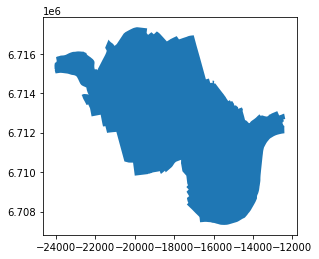

In [23]:
df=pd.DataFrame({})
for url in urls:
    try:
        dfu = gpd.read_file(url)
        df=gpd.GeoDataFrame(pd.concat([df,dfu]),crs=('epsg:4326'))
    except:
        raise ValueError('check the selected region on OSM corresponds to a valid Relation')
dfp=df.to_crs(epsg=3857)
dfp['diss']=1
dfp.plot()

This section dissolves the boundaries of contiguous polygons and offsets the joint boundary by 10 m, to include marginal streets

<AxesSubplot:>

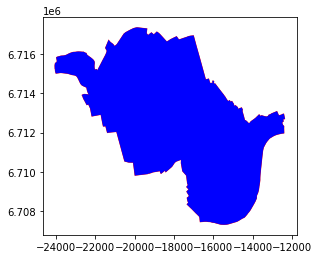

In [24]:
dfpd=dfp.dissolve(by='diss')
dfpdb=dfpd.buffer(10)
ax=dfpdb.plot(facecolor='red')
dfpd.plot(ax=ax,facecolor='blue')

In [25]:
print(dfpdb.crs)

epsg:3857


These are the boundaries of the rectangle that has my polygons inscribed, in this order: x_min,y_min,x_max,y_max

In [26]:
bounds=dfp.geometry.total_bounds

In this section, the coordinates of the encapsulating polygon's vertices are extracted in the list all_coords, for further querying

In [27]:
Polygons=[]
for row in dfp.geometry:
    a=list(row.geoms)
    for item in a:
        b=list(item)
        for pol in b:
            Polygons.append(pol)
Polygons

In [28]:
all_coords = []
for c in Polygons: # for first feature/row
    tom=c.boundary.coords.xy
    coords = np.dstack(tom).tolist()
    all_coords.append(*coords)                 

all_coords

[[[-24048.227144631015, 6715214.79883528],
  [-24024.427037499416, 6715196.834086656],
  [-24032.76486735983, 6715171.139554886],
  [-24034.64616675424, 6715166.362098656],
  [-24036.538598097726, 6715154.176913978],
  [-24036.460674454167, 6715137.75109916],
  [-24032.531096429164, 6715121.253745499],
  [-24026.419656384613, 6715095.523666241],
  [-24008.831176839278, 6715033.471208567],
  [-23997.47658877836, 6714998.598221091],
  [-23941.616468298296, 6715005.7553125555],
  [-23889.11819644019, 6715013.484978397],
  [-23794.919643330923, 6715026.135164942],
  [-23746.195102210706, 6715030.250505674],
  [-23677.47758054402, 6715024.882670349],
  [-23595.546435320168, 6715015.310039455],
  [-23517.489208375926, 6715005.021710389],
  [-23408.039885027978, 6714991.7274191985],
  [-23376.43628159177, 6714984.999764633],
  [-23330.183033167166, 6714973.2442751685],
  [-23290.69800978279, 6714960.039499015],
  [-23247.706422438427, 6714946.2800734565],
  [-23180.792276522592, 6714926.45509

## Buildings elevation raster

This section queries the building elevation Image Server database:
https://image.discomap.eea.europa.eu/arcgis/rest/services/UrbanAtlas/UA_BuildingHeights_2012_10m/ImageServer

In [29]:
resturl = 'https://image.discomap.eea.europa.eu/arcgis/rest/services/UrbanAtlas/UA_BuildingHeights_2012_10m/ImageServer/exportimage'

In [45]:
post_data={
    "bbox":str(bounds[0])+','+str(bounds[1])+','+str(bounds[2])+','+str(bounds[3]), #here projected coordinates of the total bounds
    "bboxSR":"102100", # this spatial reference corresponds to the ESRI code for epsg:3857
    "format":"tiff",
    "size":str(round((bounds[2]-bounds[0]))/10)+','+str(round((bounds[3]-bounds[1]))/10), # the Copernicus dataset has a 10 m x 10 m resolution, here is round((xmax-xmin))/10, round((ymax-ymin)/10)
    "pixeltype":"S16", # provided from the metadata of the image service
    "noDataInterpretation":"esriNoDataMatchAny",
    "interpolation":"RSP_BilinearInterpolation",
    "f":"json"
}
req=requests.post(resturl,data=post_data,verify=True)
jsondict=req.json()
jsondict

{'href': 'https://image.discomap.eea.europa.eu/arcgis/rest/directories/arcgisoutput/UrbanAtlas/UA_BuildingHeights_2012_10m_ImageServer/_ags_eca7a83c_8bb7_4560_ac28_3a22f03378ed.tif',
 'width': 1168,
 'height': 1001,
 'extent': {'xmin': -24054.861786282294,
  'ymin': 6707323.827421305,
  'xmax': -12367.773538317962,
  'ymax': 6717339.902195459,
  'spatialReference': {'wkid': 102100, 'latestWkid': 3857}},
 'scale': 0}

beware after a while the request expires and tiff data are lost

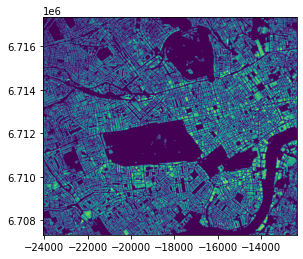

<AxesSubplot:>

In [46]:
from rasterio import plot
imageurl=jsondict["href"]
data=rasterio.open(imageurl,crs={'init': 'epsg:3857'})
rasterio.plot.show(data)

In [47]:
from rasterio import shutil
rasterio.shutil.copy(data,os.path.join(wdircity,'heights_raster.tif'))
data.close()

## Buildings footprints

This section queries the OSM database to obtain the building footprints

In [48]:
geo=[]
for item,row in df.iterrows():
    gm=row.geometry.geoms
    geo.append(gm)
geo

In [49]:
blds=pd.DataFrame({})
for gm in geo:
    bl=ox.footprints.footprints_from_polygon(gm[0])
    blds=gpd.GeoDataFrame(pd.concat([blds,bl]),crs=('epsg:4326'))
blds.head()

,nodes,building,name,source,source:name,wikipedia,geometry,created_by,addr:city,building:levels,...,name:lv,name:sk,name:th,building:roof:shape,alt_name:mi,name:mi,monastery:type,disused:office,internet,source:flats
4266524,"[25607073, 25607074, 25607075, 25607076, 17376...",yes,Lancaster House,Bing,OS_OpenData_StreetView,en:Lancaster House,"POLYGON ((-0.13952 51.50386, -0.13924 51.50356...",NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4266528,"[25607199, 25607200, 339020757, 339020758, 339...",yes,NaN,NaN,NaN,NaN,"POLYGON ((-0.13173 51.50599, -0.13196 51.50624...",Potlatch 0.10f,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4372002,"[1835289528, 1835289527, 6173728483, 163778959...",yes,National Gallery,Bing,NaN,en:National Gallery,"POLYGON ((-0.12784 51.50926, -0.12842 51.50916...",NaN,London,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4960705,"[635756147, 32843797, 32843772, 696755335, 148...",yes,NaN,NaN,NaN,NaN,"POLYGON ((-0.13496 51.52504, -0.13520 51.52495...",NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4960709,"[1043439171, 1168327490, 1168327601, 116832749...",yes,North Observatory,NaN,NaN,NaN,"POLYGON ((-0.13416 51.52463, -0.13417 51.52462...",NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<AxesSubplot:>

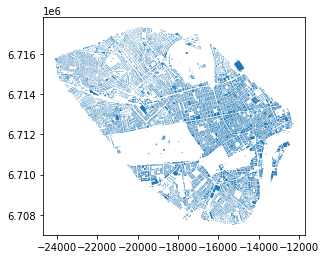

In [50]:
bldsp=blds.to_crs(epsg=3857)
bldsp.plot()

## Roads

This section queries the OSM database to extract the road network

In [51]:
roadspoly=dfpdb.to_crs('epsg:4326')

In [52]:
roads=ox.graph_from_polygon(roadspoly.geometry.iloc[0])
ox.save_graph_shapefile(roads,os.path.join(workdir,city,"roads"))
roadnetwork=gpd.read_file(os.path.join(workdir,city,"roads","edges.shp"))
roadnetwork.head()

,osmid,oneway,name,highway,maxspeed,length,from,to,service,access,...,width,lanes,junction,bridge,est_width,area,u,v,key,geometry
0,211557608,1,Duke Street St James's,residential,30 mph,18.981,2622783492,26591527,None,None,...,None,None,None,None,None,None,2622783492,26591527,0,"LINESTRING (-0.13776 51.50734, -0.13762 51.50719)"
1,"[421258904, 256633379, 421258903]",0,Mason's Yard,service,None,23.504,2622783496,2622783492,parking_aisle,yes,...,None,None,None,None,None,None,2622783492,2622783496,0,"LINESTRING (-0.13746 51.50744, -0.13758 51.507..."
2,211557608,1,Duke Street St James's,residential,30 mph,20.930,4209492990,2622783492,None,None,...,None,None,None,None,None,None,2622783492,4209492990,0,"LINESTRING (-0.13791 51.50750, -0.13776 51.50734)"
3,332654245,0,Dell's Mews,residential,None,30.509,271389597,3398008838,None,None,...,None,None,None,None,None,None,3398008838,271389597,0,"LINESTRING (-0.13907 51.49188, -0.13921 51.49162)"
4,256633379,0,Mason's Yard,service,None,18.570,4209437291,2622783496,parking_aisle,yes,...,None,None,None,None,None,None,2622783496,4209437291,0,"LINESTRING (-0.13759 51.50759, -0.13746 51.50744)"


In [53]:
nodes=gpd.read_file(os.path.join(workdir,city,"roads","nodes.shp"))
nodesp=nodes.to_crs(epsg=3857)
roadnetworkp=roadnetwork.to_crs(epsg=3857)
roadnetworkp.to_file(os.path.join(workdir,city,"roads","edges.shp"))
nodesp.to_file(os.path.join(workdir,city,"roads","nodes.shp"))

<AxesSubplot:>

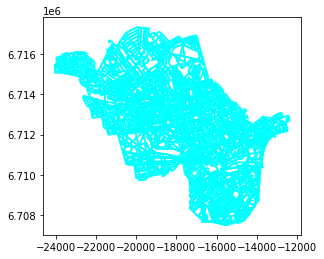

In [54]:
roadnetworkp.plot(edgecolor='cyan',linewidth=2)

## Terrain

This section queries the EU-DEM 1.1 Map Server database to get the terrain data:

In [ ]:
terresturl='https://image.discomap.eea.europa.eu/arcgis/rest/services/Elevation/EUElev_DEM_V11/MapServer/identify'

In [56]:
print(str(bounds[0])+','+str(bounds[1])+','+str(bounds[2])+','+str(bounds[3]))

-24054.861786282294,6707325.608526178,-12367.773538317962,6717338.121090588


In [57]:
dx=bounds[2]-bounds[0]
dy=bounds[3]-bounds[1]
nx=round(dx/sampld)
ny=round(dy/sampld)
xd=dx/nx
yd=dy/ny

xs=np.arange(bounds[0],bounds[2],xd)
ys=np.arange(bounds[1],bounds[3],yd)
X,Y=np.meshgrid(xs,ys)
nx,ny

(234, 200)

In [58]:
Xl = X.reshape((np.prod(X.shape),))
Yl = np.flip(Y.reshape((np.prod(Y.shape),)))
coords = zip(Xl, Yl)

In [59]:
zvalues=[]
counter=0
for point in coords:
    counter+=1
    post_datat={
    "geometry":str(point[0])+','+str(point[1]), #here projected coordinates of the total bounds
    "gGeometryType":"esriGeometryPoint",
    "tolerance":'1',
    "sr":"102100",
    "mapExtent":str(bounds[0])+','+str(bounds[1])+','+str(bounds[2])+','+str(bounds[3]),
    "imageDisplay":"600,600,96",
    "returnGeometry":True,
    "returnZ":True,
    "f":"json"
    }
    reqt=requests.post(terresturl,data=post_datat,verify=True)
    jsondictt=reqt.json()
    try:
        op=np.float64(jsondictt['results'][0]['attributes']['Pixel Value'])
    except ValueError:
        op=np.nan
    zvalues.append(op)
    print ('\r'+str(round(counter/len(Xl)*100,2))+' % complete', end='')
zvalues

2.64 % complete

KeyboardInterrupt: 

In [29]:
Z=np.array(zvalues).reshape(ny,nx)
X.shape,Y.shape,Z.shape

((200, 234), (200, 234), (200, 234))

This is the transform matrix to correctly project the raster:

In [30]:
mat=rasterio.transform.from_origin(bounds[0], bounds[3], sampld, sampld)
mat

Affine(50.0, 0.0, -24054.861786282294,
       0.0, -50.0, 6717338.121090588)

Here are the two output files for the DEM, one in GTiff format, the other in ASCII format (for Grasshopper)

In [31]:
with rasterio.open(
    wdircity+'DEM.tif',
    'w',
    driver='GTiff',
    height=Z.shape[0],
    width=Z.shape[1],
    count=1,
    dtype=Z.dtype,
    crs={'init': 'epsg:3857'},
    transform=mat,
) as dst:
    dst.write(Z, 1)

In [32]:
with rasterio.open(
    wdircity+'DEM.asc',
    'w',
    driver='AAIGrid',
    height=Z.shape[0],
    width=Z.shape[1],
    count=1,
    dtype=Z.dtype,
    crs={'init': 'epsg:3857'},
    transform=mat,
) as dst:
    dst.write(Z, 1)

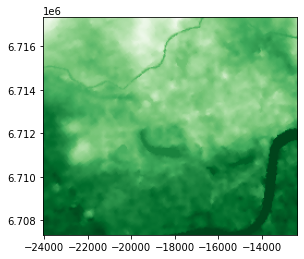

In [33]:
terrain=rasterio.open(os.path.join(wdircity,'DEM.tif'),crs={'init': 'epsg:3857'})
rasterio.plot.show(terrain,cmap='Greens_r')
terrain.close()

## Buildings height

In this section, the pixels in the Buildings height database are investigated per each footprint via Zonal Statistics

In [34]:
data=rasterio.open(os.path.join(wdircity,'heights_raster.tif'),crs={'init': 'epsg:3857'})
data.crs

CRS.from_dict(init='epsg:3857')

In [35]:
data.meta

{'driver': 'GTiff',
 'dtype': 'int16',
 'nodata': None,
 'width': 1168,
 'height': 1001,
 'count': 1,
 'crs': CRS.from_dict(init='epsg:3857'),
 'transform': Affine(10.006068705448914, 0.0, -24054.861786282294,
        0.0, -10.006068705449012, 6717339.902195459)}

In [36]:
data.count # number of bands in the dataset

1

Here a plot is shown to check everything is alright, before proceeding to the zonal stats:

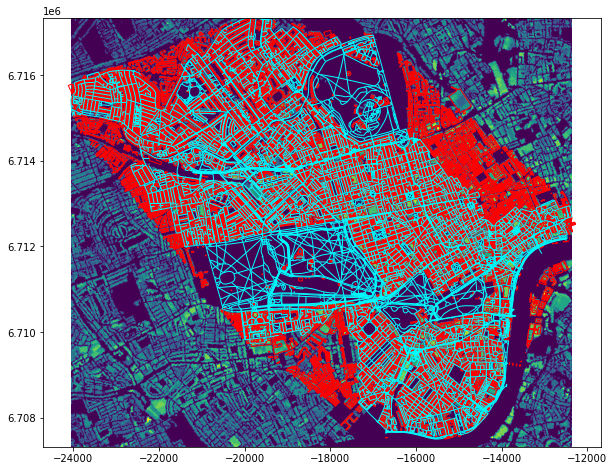

In [37]:
fig=plt.figure(figsize=((10,8)))
ax=fig.add_subplot(111)
terrain=rasterio.open(os.path.join(wdircity,'DEM.tif'),crs={'init': 'epsg:3857'})
rasterio.plot.show(ax=ax,source=data)
#rasterio.plot.show(ax=ax,source=terrain,cmap='Greens_r')
bldsp.plot(ax=ax,facecolor='None', edgecolor='red', linewidth=1)
roadnetworkp.plot(ax=ax,edgecolor='cyan',linewidth=1)
plt.show()
terrain.close()

Here the zonal stats are extracted from the categorical raster:

In [38]:
from rasterstats import zonal_stats
cmap={
    1:'2-4 m',
    2:'4-6 m',
    3:'6-8 m',
    4:'8-10 m',
    5:'10-15 m',
    6:'15-20 m',
    7:'20-30 m',
    8:'30-60 m',
    9:'60-100 m',
    10:'100-368 m'
}
array=data.read(1)
affine=data.transform
zs = zonal_stats(bldsp, array, affine=affine,geojson_out=True,categorical=True, category_map=cmap)
data.close()
zs

C:\Users\florio\AppData\Local\Continuum\anaconda3\lib\site-packages\rasterstats\io.py:301: UserWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn("Setting nodata to -999; specify nodata explicitly")


[{'id': '4266524',
  'type': 'Feature',
  'properties': {'3dmr': None,
   'FIXME': None,
   'HE_ref': None,
   'access': None,
   'accessories': None,
   'accommodation': None,
   'addr2:postcode': None,
   'addr2:street': None,
   'addr:accessvia': None,
   'addr:city': None,
   'addr:country': None,
   'addr:district': None,
   'addr:flats': None,
   'addr:floor': None,
   'addr:housename': None,
   'addr:housename:cy': None,
   'addr:housename:source': None,
   'addr:housenumber': None,
   'addr:housenumber:source': None,
   'addr:interpolation': None,
   'addr:name': None,
   'addr:place': None,
   'addr:postcode': None,
   'addr:postcode_alt': None,
   'addr:province': None,
   'addr:source': None,
   'addr:street': None,
   'addr:street:source': None,
   'addr:suburb': None,
   'addr:unit': None,
   'air_conditioning': None,
   'ale': None,
   'alt_addr:housename': None,
   'alt_name': None,
   'alt_name1:en': None,
   'alt_name2': None,
   'alt_name:de': None,
   'alt_name:en': 

In [39]:
import random
export=gpd.GeoDataFrame.from_features(zs,crs='epsg:3857')
for i in cmap.values():
    try:
        type(export[i])
    except:
        export[i]=np.nan
export
exp=pd.DataFrame({})
exp=export[['geometry','building:levels',0,'2-4 m','4-6 m','6-8 m','8-10 m','10-15 m','15-20 m','20-30 m','30-60 m','60-100 m','100-368 m']].copy()
expo=exp.fillna({0:0,'2-4 m':0,
    '4-6 m':0,
    '6-8 m':0,
    '8-10 m':0,
    '10-15 m':0,
    '15-20 m':0,
    '20-30 m':0,
    '30-60 m':0,
    '60-100 m':0,
    '100-368 m':0})
expo=expo.rename(columns={0:'0 m'})
expo

,geometry,building:levels,0 m,2-4 m,4-6 m,6-8 m,8-10 m,10-15 m,15-20 m,20-30 m,30-60 m,60-100 m,100-368 m
0,"POLYGON ((-15531.206 6710908.991, -15499.759 6...",None,1.0,0.0,0.0,1.0,3.0,6.0,13.0,26.0,0.0,0.0,0.0
1,"POLYGON ((-14663.694 6711289.620, -14689.842 6...",None,0.0,0.0,0.0,0.0,0.0,0.0,6.0,80.0,12.0,0.0,0.0
2,"POLYGON ((-14231.540 6711874.538, -14296.016 6...",2,33.0,0.0,0.0,0.0,3.0,40.0,232.0,17.0,0.0,0.0,0.0
3,"POLYGON ((-15023.834 6714697.684, -15050.239 6...",None,75.0,0.0,0.0,0.0,3.0,27.0,134.0,38.0,0.0,0.0,0.0
4,"POLYGON ((-14934.189 6714624.524, -14935.269 6...",None,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
32889,"POLYGON ((-22872.304 6714560.560, -22927.841 6...",None,49.0,0.0,7.0,20.0,38.0,15.0,0.0,0.0,0.0,0.0,0.0
32890,"POLYGON ((-23303.633 6714888.541, -23366.974 6...",4,50.0,0.0,3.0,5.0,0.0,2.0,13.0,0.0,0.0,0.0,0.0
32891,"POLYGON ((-13647.603 6713898.485, -13631.317 6...",None,6.0,0.0,0.0,0.0,0.0,1.0,12.0,1.0,0.0,0.0,0.0
32892,"POLYGON ((-13619.650 6713833.096, -13608.997 6...",None,2.0,0.0,0.0,0.0,0.0,1.0,17.0,13.0,0.0,0.0,0.0


Here the height is calculated, using random values within the range of each class, weighted by the number of pixels in the respective class

In [40]:
calc_h=[]
for index,row in expo.iterrows():
    if np.sum(np.array([row['2-4 m'],row['4-6 m'],row['6-8 m'],row['8-10 m'],row['10-15 m'],row['15-20 m'],row['20-30 m'],row['30-60 m'],row['60-100 m'],row['100-368 m']]))==0:
        h=np.nan
    else:
        h=np.round((row['2-4 m']*random.randint(2,4)+row['4-6 m']*random.randint(4,6)+row['6-8 m']*random.randint(6,8)+row['8-10 m']*random.randint(6,8)+row['10-15 m']*random.randint(10,15)+row['15-20 m']*random.randint(15,20)+row['20-30 m']*random.randint(20,30)+row['30-60 m']*random.randint(30,60)+row['60-100 m']*random.randint(60,100)+row['100-368 m']*random.randint(100,368))/(row['2-4 m']+row['4-6 m']+row['6-8 m']+row['8-10 m']+row['10-15 m']+row['15-20 m']+row['20-30 m']+row['30-60 m']+row['60-100 m']+row['100-368 m']))
    calc_h.append(h)
expo['calc_h']=np.array(calc_h)
expo['calc_h'].mean()

13.654579410162633

In [41]:
expo.to_file(driver='ESRI Shapefile',filename=os.path.join(wdircity,'buildings_fp.shp'))

## Validation

This section queries again the building heights database, but to obtain numerical category values instead of a raster image, so they can be used to check the compliance with calculated heights

In [42]:
resturlv1 = 'https://image.discomap.eea.europa.eu/arcgis/rest/services/UrbanAtlas/UA_BuildingHeights_2012_10m/ImageServer/computeStatisticsHistograms'

In [43]:
post_datav1={
    "geometry":'{"rings" :'+str(all_coords)+'}'+',{"spatialReference" : {"wkid" : 3857}}',
    "geometryType":"esriGeometryPolygon",
    "f":"json"
}
reqv1=requests.post(resturlv1,data=post_datav1,verify=True)
jsondictv1=reqv1.json()
jsondictv1['statistics']

[{'min': 1,
  'max': 10,
  'mean': 5.305096782574751,
  'standardDeviation': 1.596732485334128,
  'median': 4.988235294117647,
  'mode': 4.988235294117647,
  'skipX': 1,
  'skipY': 1,
  'count': 230930}]

## OSM Buildings attributes

This section can be used to investigate some properties of the buildings footprints

In [44]:
list(blds)

['nodes',
 'building',
 'name',
 'source',
 'source:name',
 'wikipedia',
 'geometry',
 'created_by',
 'addr:city',
 'building:levels',
 'fee',
 'name:de',
 'name:en',
 'name:es',
 'name:gl',
 'name:ru',
 'name:uk',
 'name:zh',
 'opening_hours',
 'postal_code',
 'toilets:wheelchair',
 'tourism',
 'website',
 'wheelchair',
 'wikidata',
 'addr:postcode',
 'addr:street',
 'layer',
 'addr:country',
 'addr:housenumber',
 'building:colour',
 'building:material',
 'operator',
 'roof:colour',
 'roof:shape',
 'source:addr',
 'note',
 'ref',
 'railway',
 'alt_name',
 'height',
 'man_made',
 'name:he',
 'old_name',
 'tower:type',
 'roof:levels',
 'addr:housename',
 'contact:website',
 'amenity',
 'religion',
 'wikimedia_commons',
 'uri',
 'country',
 'diplomatic',
 'embassy',
 'office',
 'target',
 'fhrs:confidence_management',
 'fhrs:hygiene',
 'fhrs:id',
 'fhrs:local_authority_id',
 'fhrs:rating',
 'fhrs:structural',
 'source:postcode',
 'start_date',
 'denomination',
 'name:fr',
 'name:ja',
 'n

In [45]:
validp=len(blds['building:levels'].dropna())/len(blds['building:levels'])*100
validn=len(blds['building:levels'].dropna())
print('in the selected district '+'{0:.2f}'.format(validp)+'% of buildings have valid levels i.e. '+str(validn)+' buildings')

in the selected district 64.12% of buildings have valid levels i.e. 21091 buildings
